In [ ]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks from prompts with SAM

The Segment Anything Model (SAM) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt.

The `SamPredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

In [1]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

## Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [2]:
using_colab = True

In [3]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-j4vexmxp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-j4vexmxp
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=931d5acb7f5ff7800d81521686736293631e473f183f8d81a35a1ea6111865ad
  Stored in directory: /tmp/pip-ephem-wheel-cache-7n6ats8f/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything
--2025-05-21 02:25:57--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.c

## Set-up

Necessary imports and helper functions for displaying points, boxes, and masks.

In [4]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [18]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def get_mask_bbox(mask, padding=5):
    # 找到 mask 中值为 True 的像素坐标
    y, x = np.where(mask == True)
    if len(x) == 0 or len(y) == 0:
        return None
    x_min, x_max = x.min(), x.max()
    y_min, y_max = y.min(), y.max()

    # 添加 padding，确保框覆盖整个 mask
    x_min = max(0, x_min - padding)
    y_min = max(0, y_min - padding)
    x_max = min(mask.shape[1], x_max + padding)
    y_max = min(mask.shape[0], y_max + padding)

    return x_min, y_min, x_max, y_max

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


## Example image

In [19]:
from google.colab import files
uploaded = files.upload()



Saving D.jpg to D (1).jpg


In [20]:
image = cv2.imread('D.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 目标统一尺寸
target_width = 500
target_height = 500

# 获取原图尺寸
h, w = image.shape[:2]

# 计算等比例缩放因子
scale = min(target_width / w, target_height / h)
new_w = int(w * scale)
new_h = int(h * scale)

# 等比例缩放
resized_image = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)

# 计算边界填充大小
top = (target_height - new_h) // 2
bottom = target_height - new_h - top
left = (target_width - new_w) // 2
right = target_width - new_w - left

# 使用黑色填充边界（可改为其他颜色）
padded_image = cv2.copyMakeBorder(resized_image, top, bottom, left, right, borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))


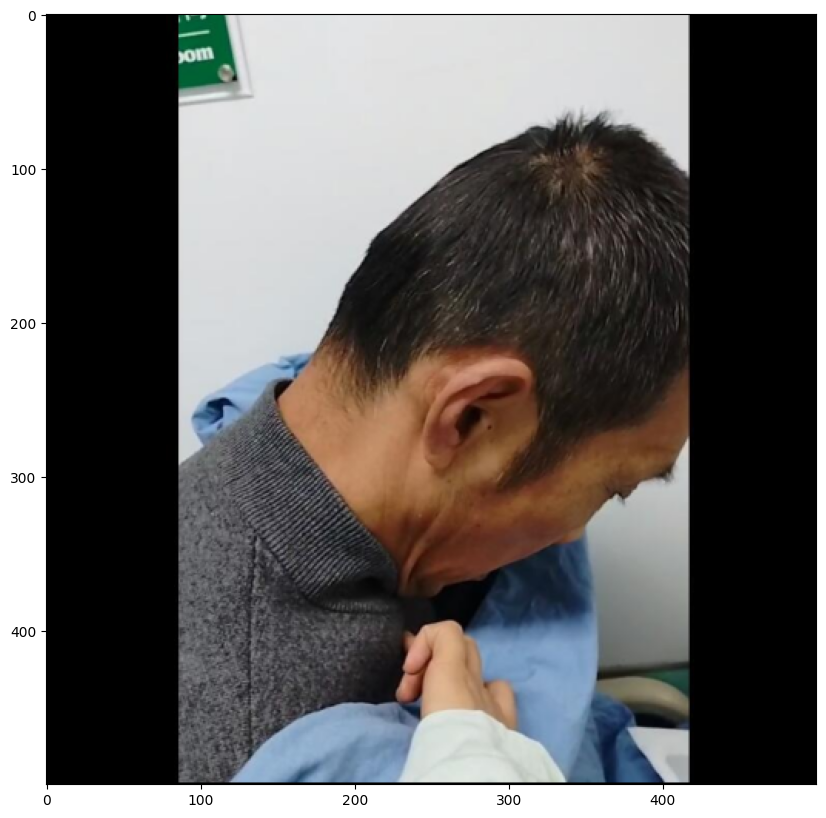

In [30]:
plt.figure(figsize=(10,10))
plt.imshow(padded_image)
plt.axis('on')
plt.show()

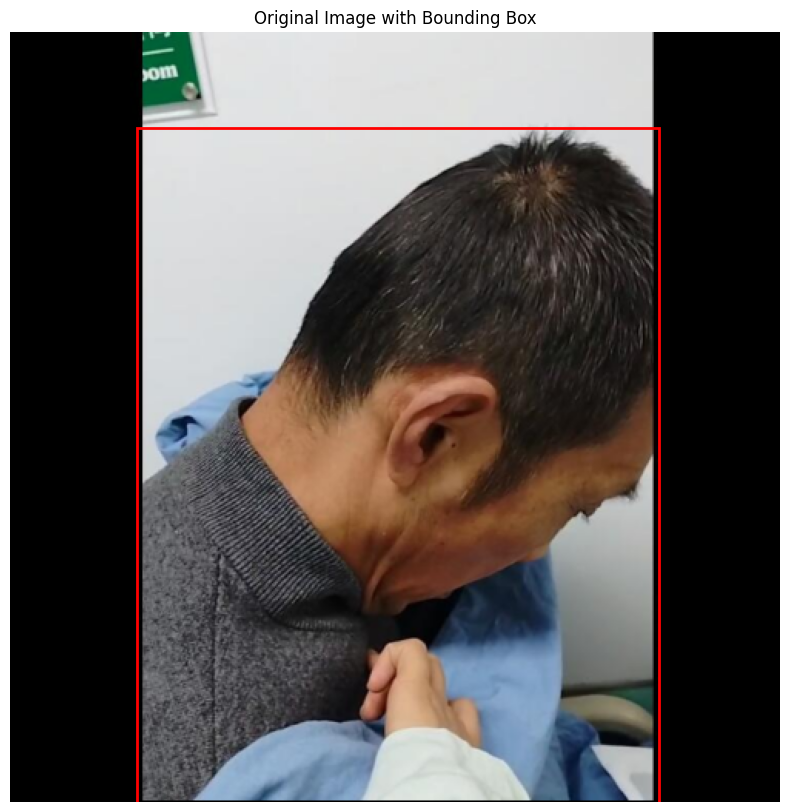

In [31]:
import matplotlib.patches as patches
x_min, y_min, x_max, y_max = 82, 62, 421, 500

# 创建画布
plt.figure(figsize=(10, 10))

# 显示原图
plt.imshow(padded_image)

# 创建矩形框
rect = patches.Rectangle(
    (x_min, y_min),  # 左上角坐标 (x_min, y_min)
    x_max - x_min,   # 宽度
    y_max - y_min,   # 高度
    linewidth=2,     # 边框线宽
    edgecolor='red', # 边框颜色
    facecolor='none' # 无填充
)

# 将矩形框添加到图像上
plt.gca().add_patch(rect)

# 添加标题和关闭坐标轴
plt.title("Original Image with Bounding Box")
plt.axis('off')

# 显示图像
plt.show()

## Selecting objects with SAM

First, load the SAM model and predictor. Change the path below to point to the SAM checkpoint. Running on CUDA and using the default model are recommended for best results.

In [22]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

Process the image to produce an image embedding by calling `SamPredictor.set_image`. `SamPredictor` remembers this embedding and will use it for subsequent mask prediction.

In [23]:
predictor.set_image(padded_image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [24]:
input_point = np.array([[250, 250],[300,150],[400,400]])
input_label = np.array([1,1,0])

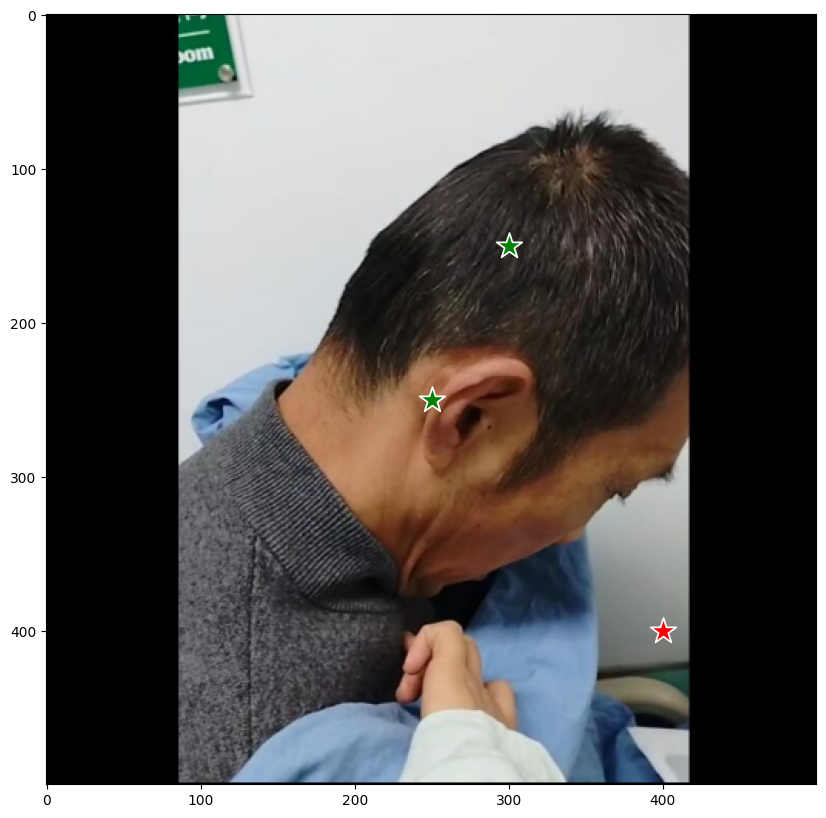

In [25]:
plt.figure(figsize=(10,10))
plt.imshow(padded_image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()

Predict with `SamPredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [26]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

With `multimask_output=True` (the default setting), SAM outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [27]:
masks.shape  # (number_of_masks) x H x W

(3, 500, 500)

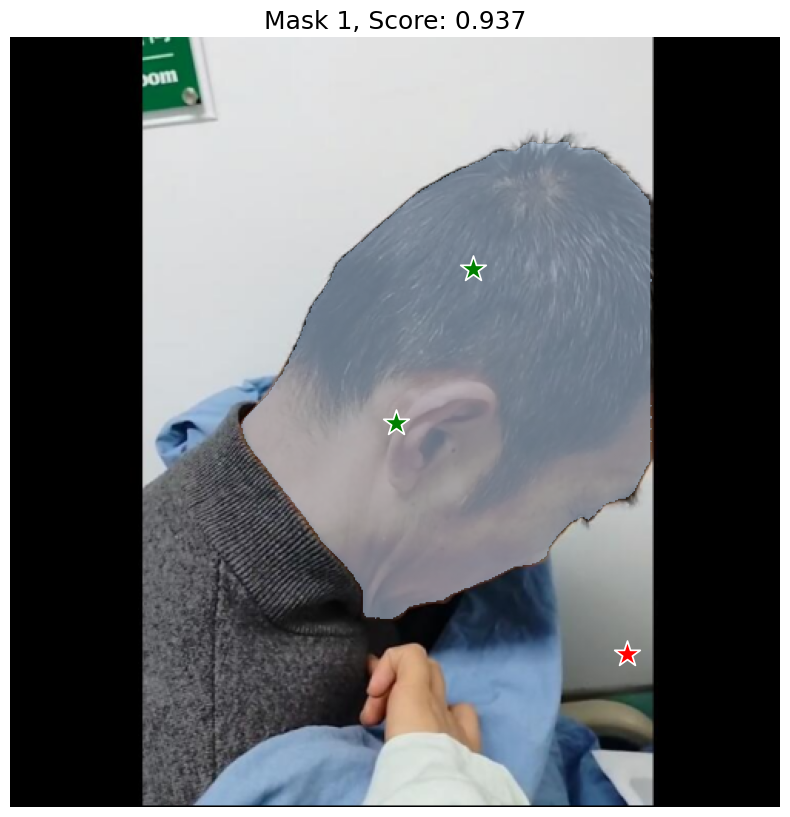

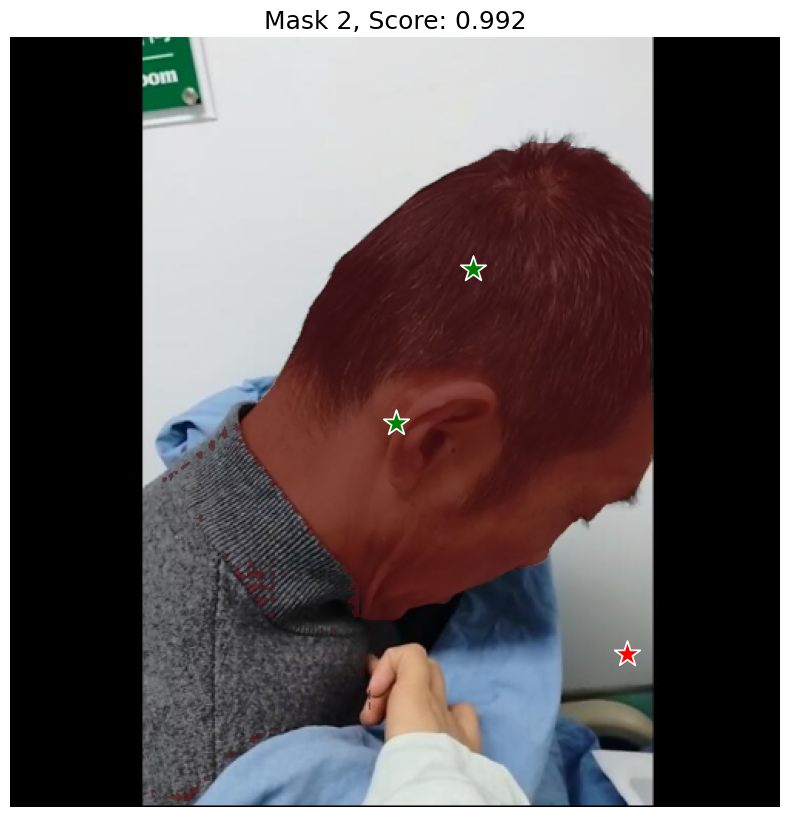

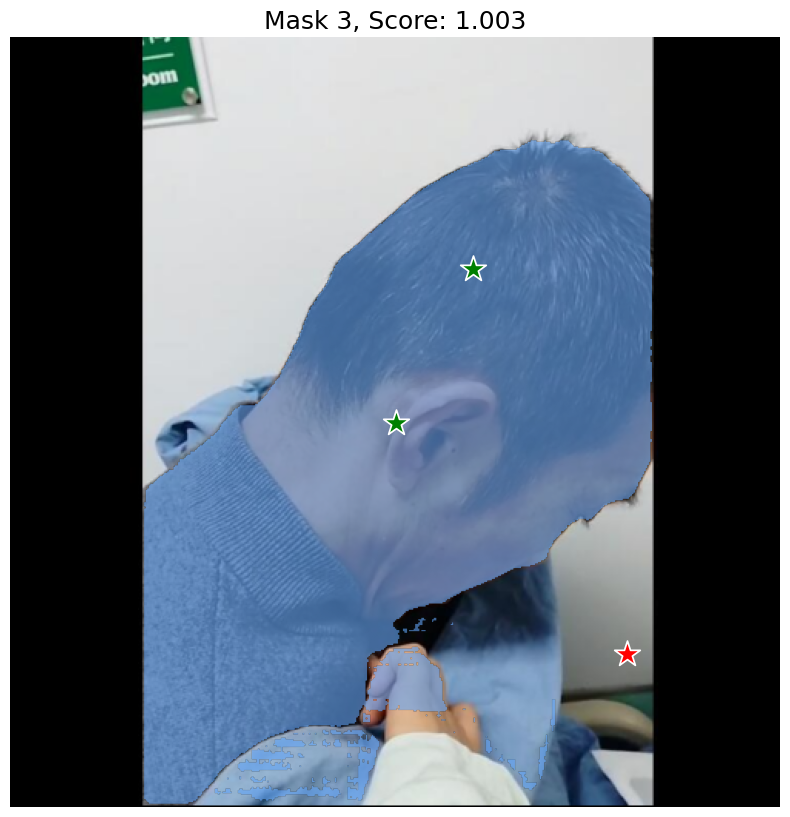

In [28]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10, 10))
    plt.imshow(padded_image)  # 显示原图
    show_mask(mask, plt.gca(), random_color=True)  # 显示 mask，随机颜色
    show_points(input_point, input_label, plt.gca())  # 显示交互点
    plt.title(f"Mask {i + 1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()

Bounding box: x_min=82, y_min=62, x_max=421, y_max=500
Box size: width=340, height=439


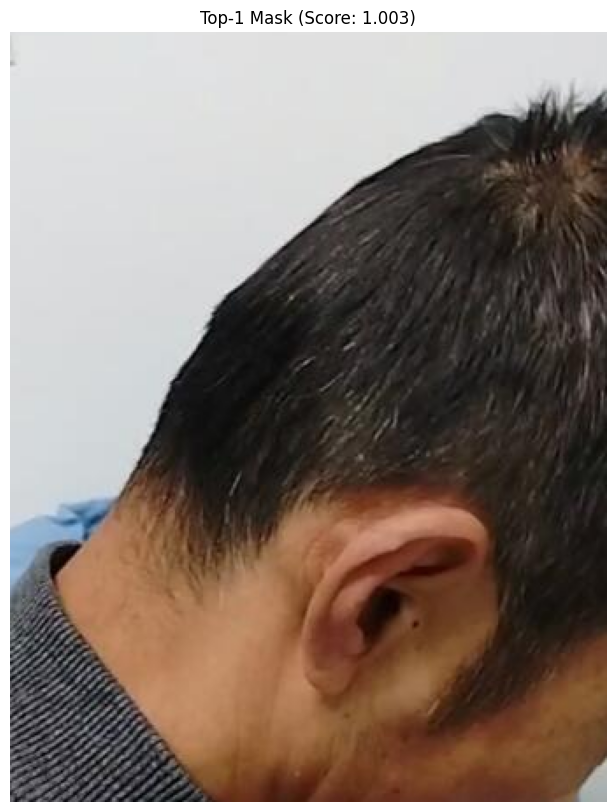

In [29]:
top_index = np.argmax(scores)
top_mask = masks[top_index]

bbox = get_mask_bbox(top_mask, padding=5)
if bbox is None:
    print("未检测到 mask 区域")
else:
    x_min, y_min, x_max, y_max = bbox
    print(f"Bounding box: x_min={x_min}, y_min={y_min}, x_max={x_max}, y_max={y_max}")
    print(f"Box size: width={x_max-x_min+1}, height={y_max-y_min+1}")

    # 裁剪原图
    cropped_image = image[y_min:y_max+1, x_min:x_max+1]

    # 可视化裁剪结果
    plt.figure(figsize=(10, 10))
    plt.imshow(cropped_image)
    plt.title(f"Top-1 Mask (Score: {scores[top_index]:.3f})")
    plt.axis('off')
    plt.show()

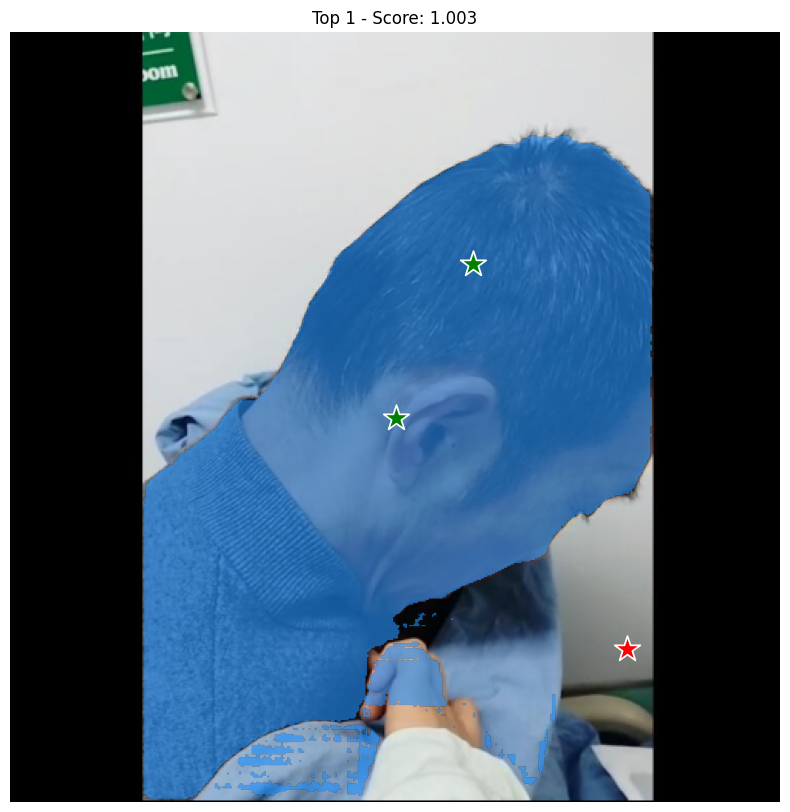

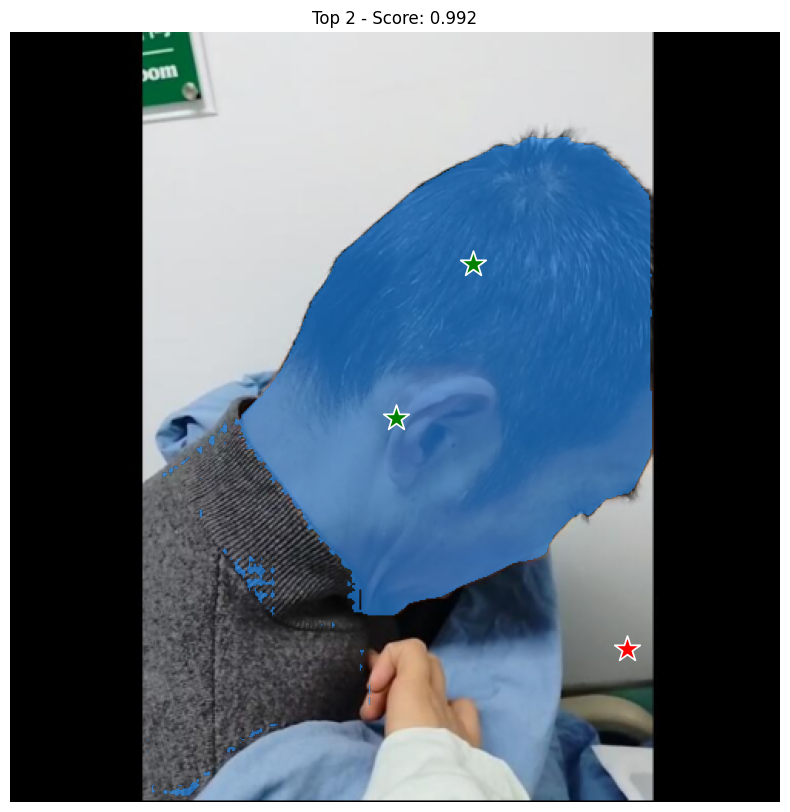

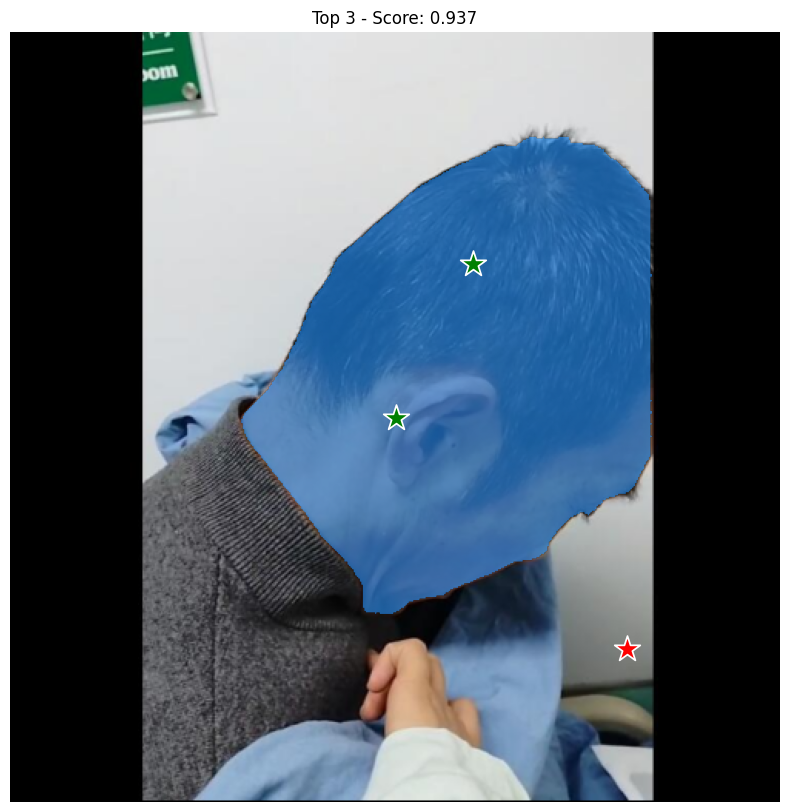

In [17]:
# 获取得分最高的前三个 mask 的索引
top3_indices = np.argsort(scores)[-3:][::-1]  # 从大到小排序

# 显示前3个 mask
for i, idx in enumerate(top3_indices):
    mask = masks[idx]
    score = scores[idx]

    plt.figure(figsize=(10, 10))
    plt.imshow(padded_image)  # 原图
    show_mask(mask, plt.gca())  # 显示 mask
    show_points(input_point, input_label, plt.gca())  # 显示输入点
    plt.title(f"Top {i+1} - Score: {score:.3f}")
    plt.axis("off")
    plt.show()

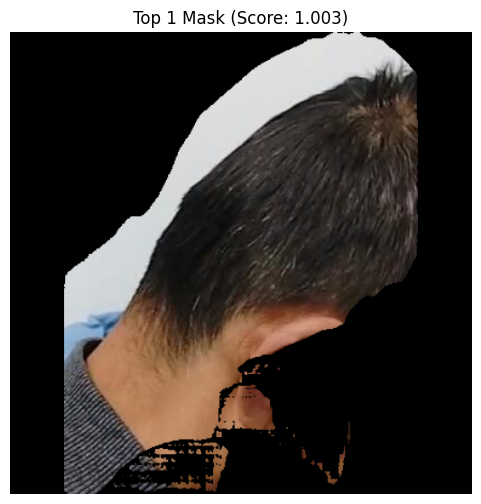

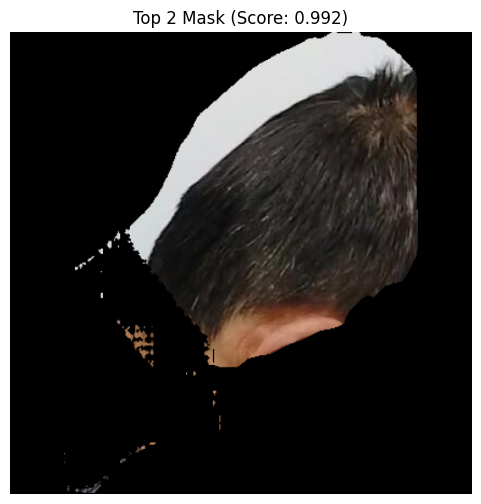

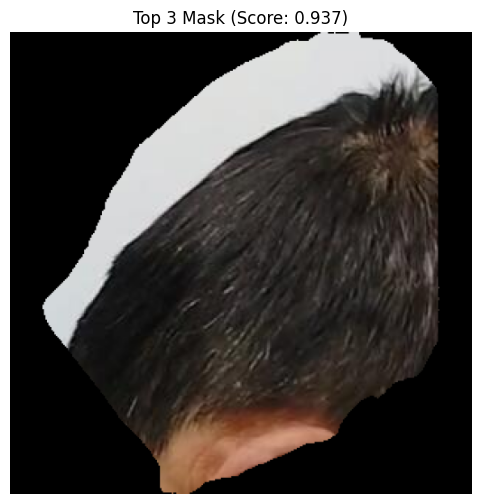

In [40]:

top3 = sorted(zip(masks, scores), key=lambda x: -x[1])[:3]
target_size = (512, 512)  # 最终统一大小 (H, W)

for i, (mask, score) in enumerate(top3):
    # Step 1: 确保 mask 是布尔型（True/False）
    mask = mask.astype(bool)

    # Step 2: 找到非零区域（y1:y2, x1:x2）
    coords = np.argwhere(mask)
    if coords.shape[0] == 0:
        print(f"Mask {i+1} is empty, skipping...")
        continue
    y1, x1 = coords.min(axis=0)
    y2, x2 = coords.max(axis=0) + 1  # +1 保证包含边界

    # Step 3: 裁剪图像和 mask
    cropped_image = image[y1:y2, x1:x2]
    cropped_mask = mask[y1:y2, x1:x2]

    # Step 4: 保留 mask 区域，其他置黑（逐像素保留）
    masked_image = cropped_image.copy()
    masked_image[~cropped_mask] = 0  # 非兴趣区域置黑

    # Step 5: 等比例缩放
    h, w = masked_image.shape[:2]
    scale = min(target_size[0] / h, target_size[1] / w)
    new_h, new_w = int(h * scale), int(w * scale)
    resized = cv2.resize(masked_image, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # Step 6: 添加边界填充（中心对齐）
    pad_top = (target_size[0] - new_h) // 2
    pad_bottom = target_size[0] - new_h - pad_top
    pad_left = (target_size[1] - new_w) // 2
    pad_right = target_size[1] - new_w - pad_left

    padded_image = cv2.copyMakeBorder(resized, pad_top, pad_bottom, pad_left, pad_right,
                                      borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

    # Step 7: 显示
    plt.figure(figsize=(6, 6))
    plt.imshow(padded_image)
    plt.title(f"Top {i+1} Mask (Score: {score:.3f})")
    plt.axis('off')
    plt.show()


## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [ ]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [ ]:
masks.shape

(1, 1200, 1800)

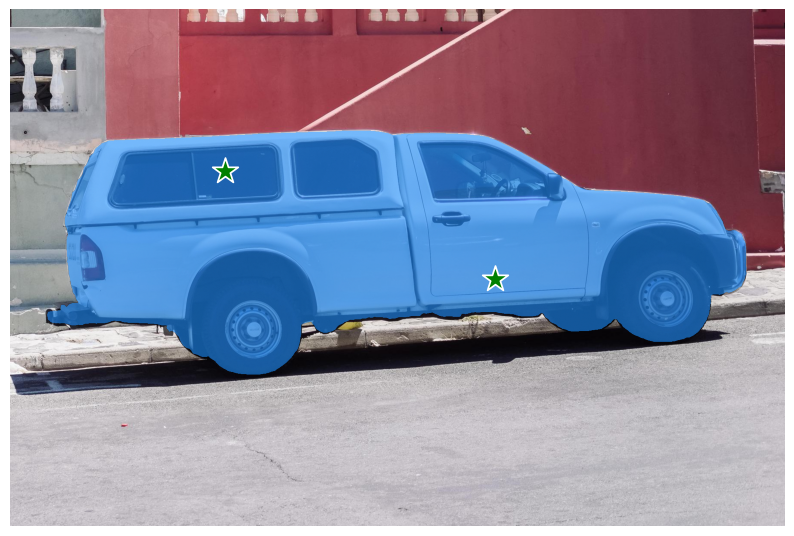

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [ ]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

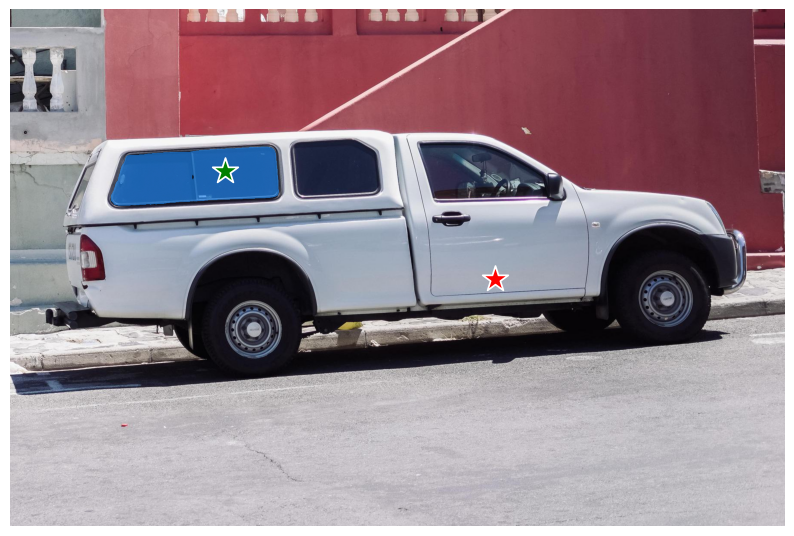

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [ ]:
input_box = np.array([425, 600, 700, 875])

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

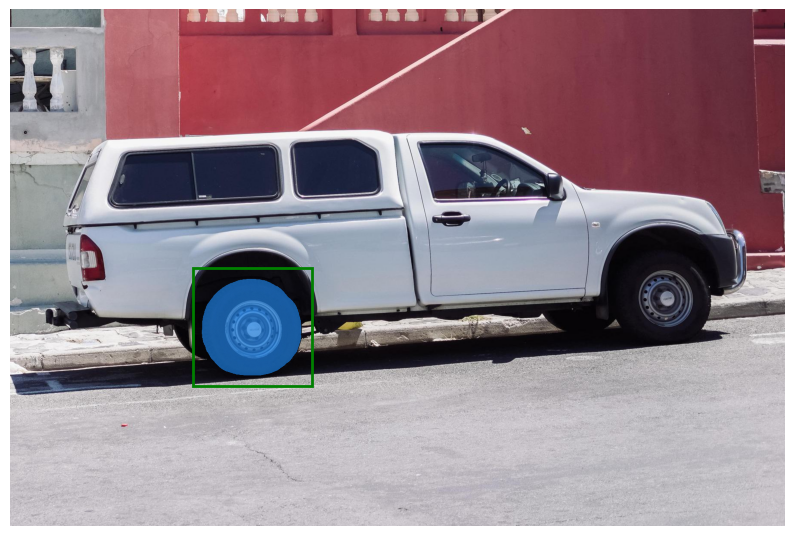

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

## Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [ ]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [ ]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

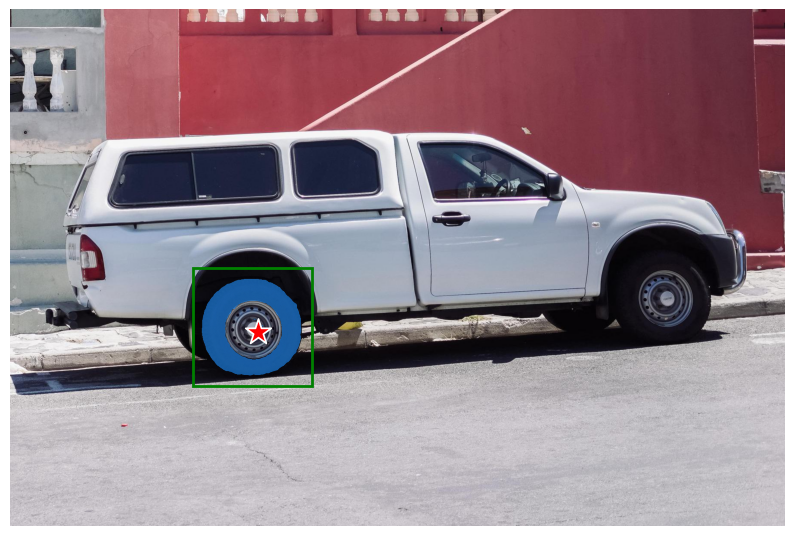

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

## Batched prompt inputs

SamPredictor can take multiple input prompts for the same image, using `predict_torch` method. This method assumes input points are already torch tensors and have already been transformed to the input frame. For example, imagine we have several box outputs from an object detector.

In [ ]:
input_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=predictor.device)

Transform the boxes to the input frame, then predict masks. `SamPredictor` stores the necessary transform as the `transform` field for easy access, though it can also be instantiated directly for use in e.g. a dataloader (see `segment_anything.utils.transforms`).

In [ ]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [ ]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([4, 1, 1200, 1800])

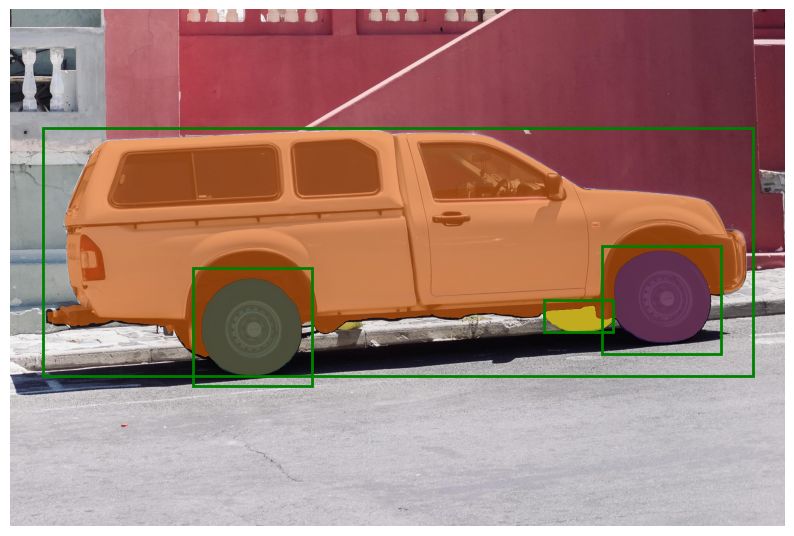

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

## End-to-end batched inference

If all prompts are available in advance, it is possible to run SAM directly in an end-to-end fashion. This also allows batching over images.

In [ ]:
image1 = image  # truck.jpg from above
image1_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=sam.device)

image2 = cv2.imread('images/groceries.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_boxes = torch.tensor([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
], device=sam.device)

Both images and prompts are input as PyTorch tensors that are already transformed to the correct frame. Inputs are packaged as a list over images, which each element is a dict that takes the following keys:
* `image`: The input image as a PyTorch tensor in CHW format.
* `original_size`: The size of the image before transforming for input to SAM, in (H, W) format.
* `point_coords`: Batched coordinates of point prompts.
* `point_labels`: Batched labels of point prompts.
* `boxes`: Batched input boxes.
* `mask_inputs`: Batched input masks.

If a prompt is not present, the key can be excluded.

In [ ]:
from segment_anything.utils.transforms import ResizeLongestSide
resize_transform = ResizeLongestSide(sam.image_encoder.img_size)

def prepare_image(image, transform, device):
    image = transform.apply_image(image)
    image = torch.as_tensor(image, device=device.device)
    return image.permute(2, 0, 1).contiguous()

In [ ]:
batched_input = [
     {
         'image': prepare_image(image1, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image1_boxes, image1.shape[:2]),
         'original_size': image1.shape[:2]
     },
     {
         'image': prepare_image(image2, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image2_boxes, image2.shape[:2]),
         'original_size': image2.shape[:2]
     }
]

Run the model.

In [ ]:
batched_output = sam(batched_input, multimask_output=False)

The output is a list over results for each input image, where list elements are dictionaries with the following keys:
* `masks`: A batched torch tensor of predicted binary masks, the size of the original image.
* `iou_predictions`: The model's prediction of the quality for each mask.
* `low_res_logits`: Low res logits for each mask, which can be passed back to the model as mask input on a later iteration.

In [ ]:
batched_output[0].keys()

dict_keys(['masks', 'iou_predictions', 'low_res_logits'])

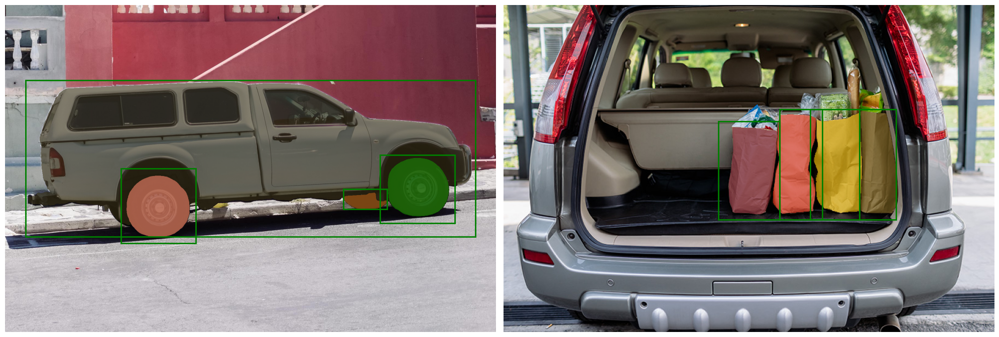

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

ax[0].imshow(image1)
for mask in batched_output[0]['masks']:
    show_mask(mask.cpu().numpy(), ax[0], random_color=True)
for box in image1_boxes:
    show_box(box.cpu().numpy(), ax[0])
ax[0].axis('off')

ax[1].imshow(image2)
for mask in batched_output[1]['masks']:
    show_mask(mask.cpu().numpy(), ax[1], random_color=True)
for box in image2_boxes:
    show_box(box.cpu().numpy(), ax[1])
ax[1].axis('off')

plt.tight_layout()
plt.show()